In [1]:
import folium
import geopandas as gpd
import numpy as np
import pandas as pd
from folium import Choropleth, Marker
from branca import colormap as cm
from geopy.geocoders import Nominatim
from matplotlib import pyplot as plt
from typing import List, Dict

In [2]:
file_path = "../Dados/wfp_food_prices_ukr.csv"

ukr_commodities_data = pd.read_csv(file_path,  dtype='unicode')

display(ukr_commodities_data)

,date,admin1,admin2,market,latitude,longitude,category,commodity,unit,priceflag,pricetype,currency,price,usdprice
0,#date,#adm1+name,#adm2+name,#loc+market+name,#geo+lat,#geo+lon,#item+type,#item+name,#item+unit,#item+price+flag,#item+price+type,#currency,#value,#value+usd
1,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Bread (rye),Loaf,actual,Retail,UAH,4.96,0.4744
2,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Bread (wheat),Loaf,actual,Retail,UAH,4.84,0.4629
3,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Buckwheat grits,KG,actual,Retail,UAH,7.44,0.7119
4,2014-03-15,NaN,NaN,National Average,NaN,NaN,cereals and tubers,Pasta,KG,actual,Retail,UAH,5.34,0.5105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95496,2023-07-15,Zhytomyrska,Zhytomyrska,Zhytomyr,50.25465,28.658667,vegetables and fruits,Apples,KG,forecast,Retail,UAH,0.0,0.0
95497,2023-07-15,Zhytomyrska,Zhytomyrska,Zhytomyr,50.25465,28.658667,vegetables and fruits,Beetroots,KG,forecast,Retail,UAH,0.0,0.0
95498,2023-07-15,Zhytomyrska,Zhytomyrska,Zhytomyr,50.25465,28.658667,vegetables and fruits,Cabbage,KG,forecast,Retail,UAH,0.0,0.0
95499,2023-07-15,Zhytomyrska,Zhytomyrska,Zhytomyr,50.25465,28.658667,vegetables and fruits,Carrots,KG,forecast,Retail,UAH,0.0,0.0


In [3]:
attrs = ['date', 'market', 'category', 'commodity', 'price', 'usdprice', 'year']

df_commodities = ukr_commodities_data[ukr_commodities_data['priceflag'] == 'actual'][1:]

df_commodities['year'] = df_commodities['date'].str[0:4]

df_commodities[['price', 'usdprice', 'year']] = df_commodities.loc[:, ('price', 'usdprice', 'year')].apply(pd.to_numeric)

df_commodities = df_commodities[attrs]

display(df_commodities)

,date,market,category,commodity,price,usdprice,year
2,2014-03-15,National Average,cereals and tubers,Bread (wheat),4.84,0.4629,2014
3,2014-03-15,National Average,cereals and tubers,Buckwheat grits,7.44,0.7119,2014
4,2014-03-15,National Average,cereals and tubers,Pasta,5.34,0.5105,2014
5,2014-03-15,National Average,cereals and tubers,Potatoes,6.74,0.6447,2014
6,2014-03-15,National Average,cereals and tubers,Rice,8.66,0.8280,2014
...,...,...,...,...,...,...,...
77511,2023-01-15,Zhytomyr,vegetables and fruits,Apples,16.23,0.4438,2023
77512,2023-01-15,Zhytomyr,vegetables and fruits,Beetroots,11.06,0.3024,2023
77513,2023-01-15,Zhytomyr,vegetables and fruits,Cabbage,12.56,0.3435,2023
77514,2023-01-15,Zhytomyr,vegetables and fruits,Carrots,22.19,0.6068,2023


In [4]:
df_commodities = df_commodities[df_commodities['year'] > 2018]

display(df_commodities)

,date,market,category,commodity,price,usdprice,year
29912,2019-01-15,Cherkasy,cereals and tubers,Barley,11.66,0.4197,2019
29913,2019-01-15,Cherkasy,cereals and tubers,Bread (first grade flour),18.78,0.6760,2019
29914,2019-01-15,Cherkasy,cereals and tubers,Bread (high grade flour),22.07,0.7944,2019
29915,2019-01-15,Cherkasy,cereals and tubers,Bread (rye),18.66,0.6717,2019
29916,2019-01-15,Cherkasy,cereals and tubers,Bread (wheat),11.86,0.4269,2019
...,...,...,...,...,...,...,...
77511,2023-01-15,Zhytomyr,vegetables and fruits,Apples,16.23,0.4438,2023
77512,2023-01-15,Zhytomyr,vegetables and fruits,Beetroots,11.06,0.3024,2023
77513,2023-01-15,Zhytomyr,vegetables and fruits,Cabbage,12.56,0.3435,2023
77514,2023-01-15,Zhytomyr,vegetables and fruits,Carrots,22.19,0.6068,2023


In [5]:
def attr_to_list(df: pd.DataFrame, attr: str) -> list:
    """
    Função auxiliar para retornar os elementos de 
    determinado atributo de um DataFrame em uma lista
    """
    try:
        return df[attr].unique().tolist()
    except KeyError:
        print(f"'{attr}' não é um atributo do DataFrame")
        
        return None

In [6]:
def plot_prices_over_time(df: pd.DataFrame, location: str):
    df_sorted = df.sort_values(by='date')
    
    categories = attr_to_list(df_sorted, "category")
    
    war_start_date = '2022-02-15' # data mais próxima do início da guerra
    
    for category in categories:
        fig, ax = plt.subplots()
        
        # linhas da categoria
        aux_categories = df_sorted[df_sorted["category"] == category]
        
        commodities_list = attr_to_list(aux_categories, "commodity")
        dates_list = attr_to_list(aux_categories, "date")
        
        min_date = dates_list[0]
        max_date = dates_list[-1]
        
        for commodity in commodities_list:
            # linhas da commodity
            aux_data = aux_categories[aux_categories["commodity"] == commodity]
            
            dates = aux_data.date.tolist()
            prices = aux_data.price.tolist()
            
            # gráfico do preço da commodity ao longo do tempo
            plt.plot(dates, prices, label = commodity)
            
        start, end = ax.get_xlim()
        steps = 3.5
        
        # melhorar visualização de datas no eixo x
        ax.xaxis.set_ticks(np.arange(start, end, steps)) 
        
        plt.axvline(x = war_start_date, linestyle = '--', color = "#0057b7")
        plt.xticks(rotation = 45, ha = 'right')
        plt.title(f"Price (UAH) of {category} commodities in\n"+
                  f"{location} from {min_date} to {max_date}")
        plt.legend(bbox_to_anchor=(1.02, 0.95), loc='upper left', borderaxespad=0)
        plt.show()

Código a seguir referente aos dados de Kyiv, capital da Ucrânia

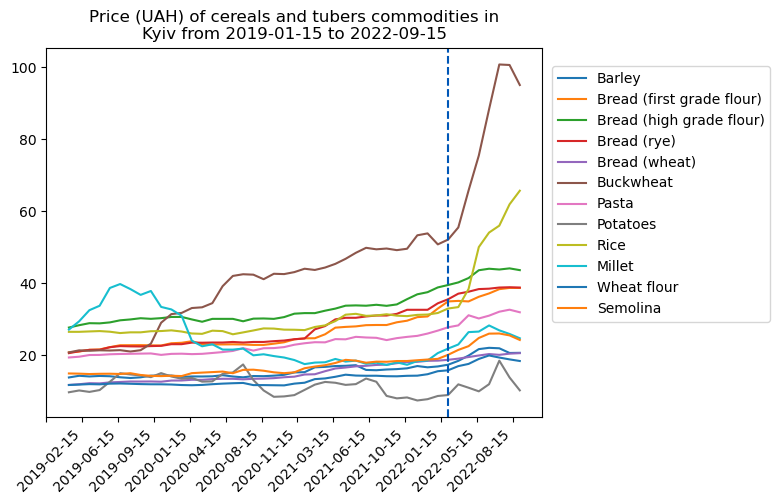

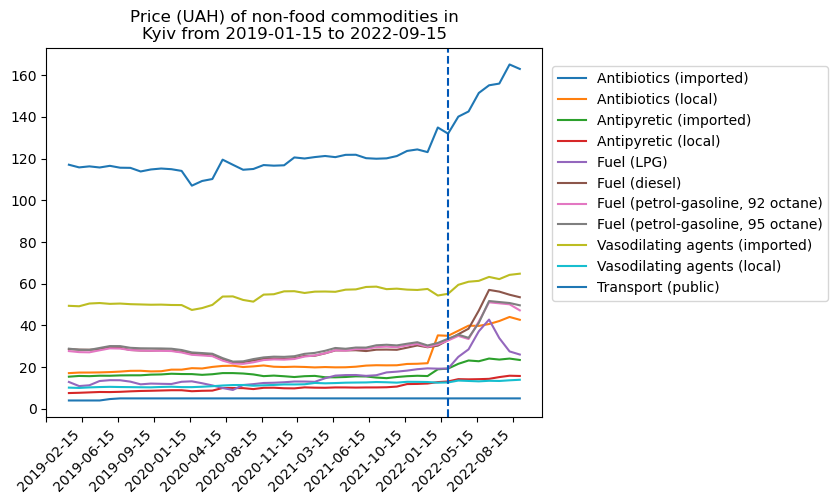

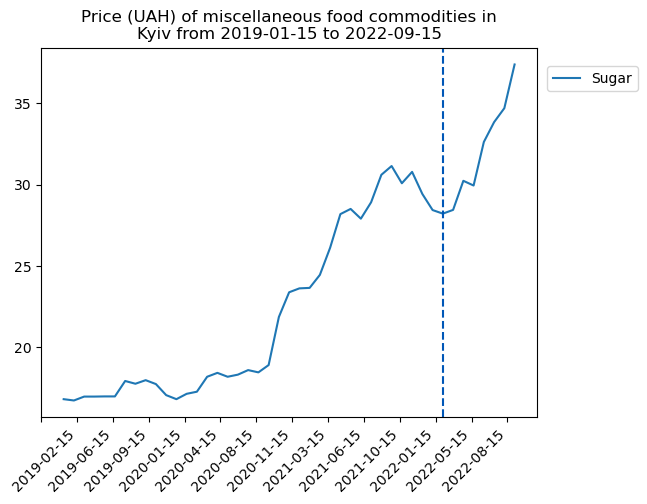

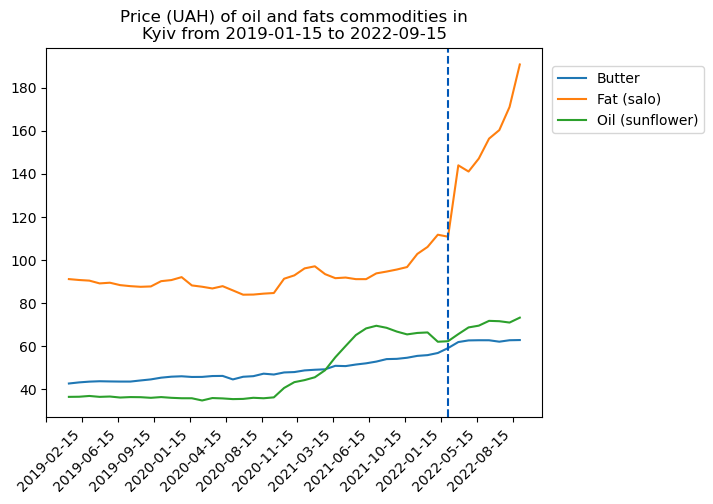

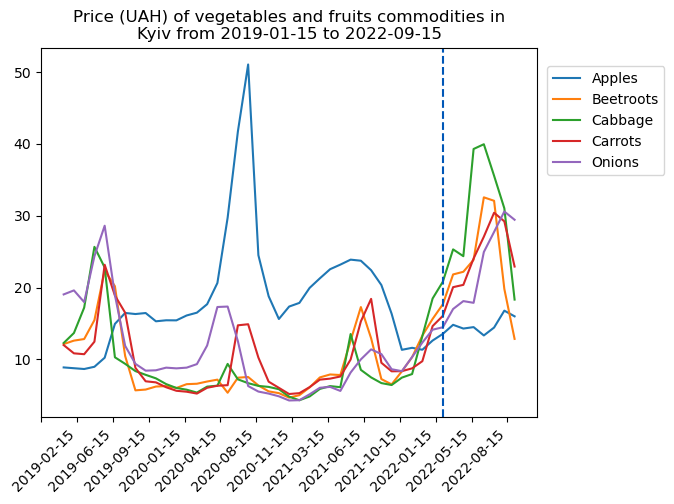

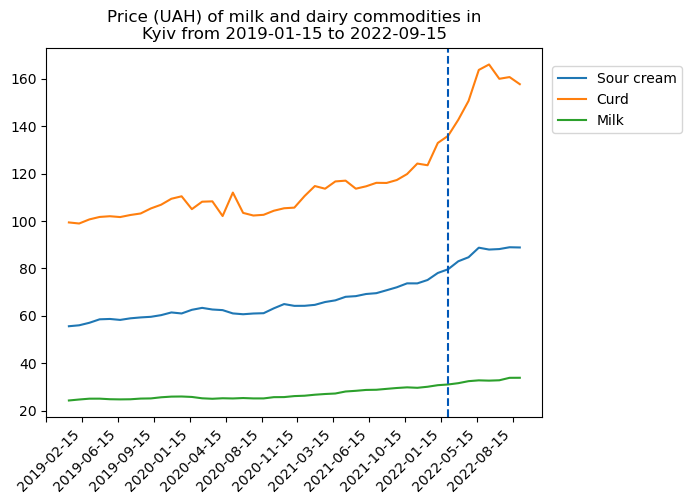

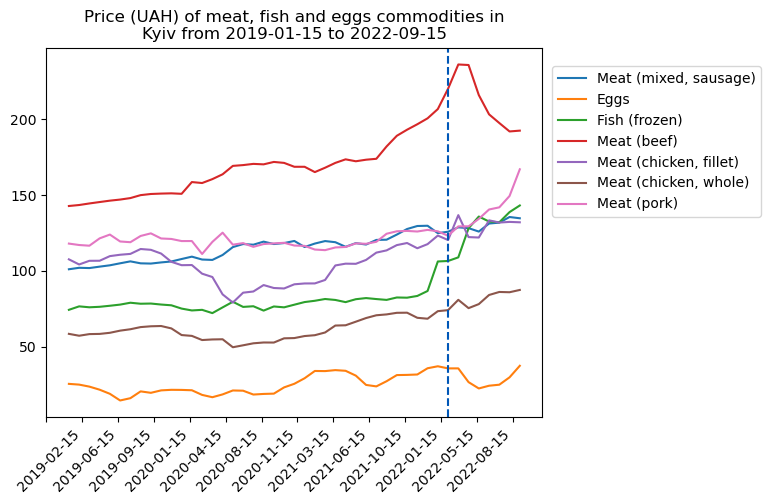

In [7]:
df_capital_data = df_commodities[df_commodities["market"] == 'Kyiv']
location = "Kyiv"

plot_prices_over_time(df_capital_data, location)

Código a seguir referente à média nacional de regiões ucranianas

In [8]:
df_markets = df_commodities[df_commodities['market'] != 'National Average'] 
df_avg_prices = df_markets.groupby(['date', 'category', 'commodity']).mean('price').reset_index()

display(df_avg_prices)

,date,category,commodity,price,usdprice,year
0,2019-01-15,cereals and tubers,Barley,11.922400,0.429144,2019.0
1,2019-01-15,cereals and tubers,Bread (first grade flour),17.803600,0.640836,2019.0
2,2019-01-15,cereals and tubers,Bread (high grade flour),21.402400,0.770360,2019.0
3,2019-01-15,cereals and tubers,Bread (rye),18.076800,0.650672,2019.0
4,2019-01-15,cereals and tubers,Bread (wheat),12.675200,0.456236,2019.0
...,...,...,...,...,...,...
1965,2023-01-15,vegetables and fruits,Apples,15.615000,0.426994,2023.0
1966,2023-01-15,vegetables and fruits,Beetroots,12.033333,0.329056,2023.0
1967,2023-01-15,vegetables and fruits,Cabbage,12.829444,0.350828,2023.0
1968,2023-01-15,vegetables and fruits,Carrots,24.417778,0.667733,2023.0


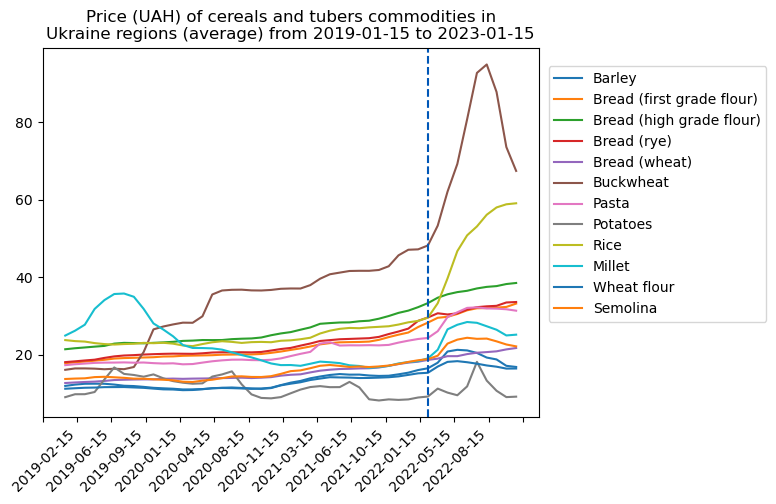

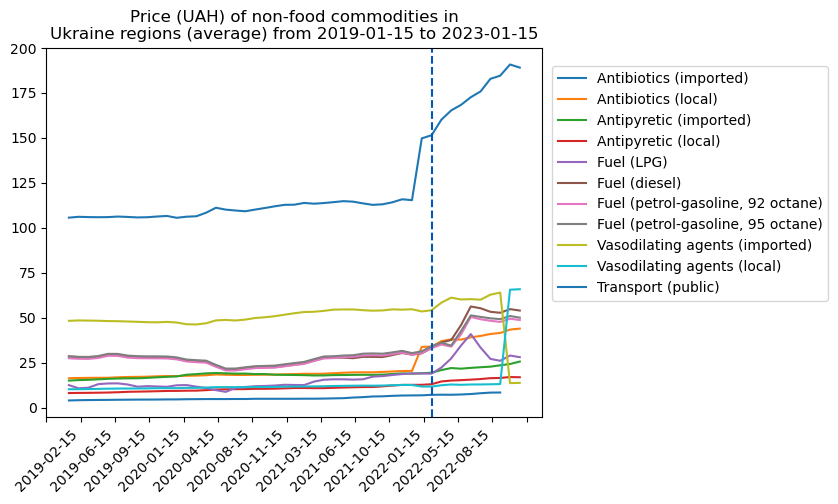

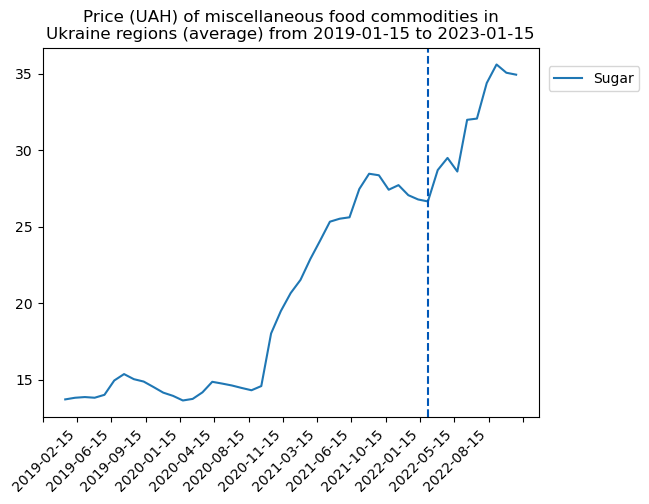

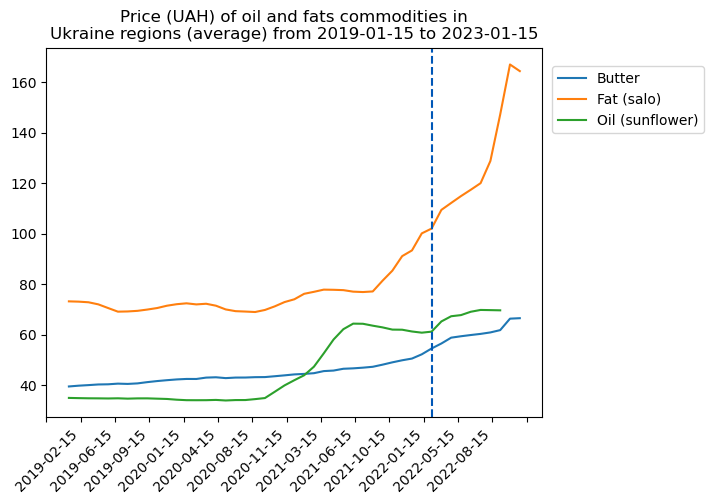

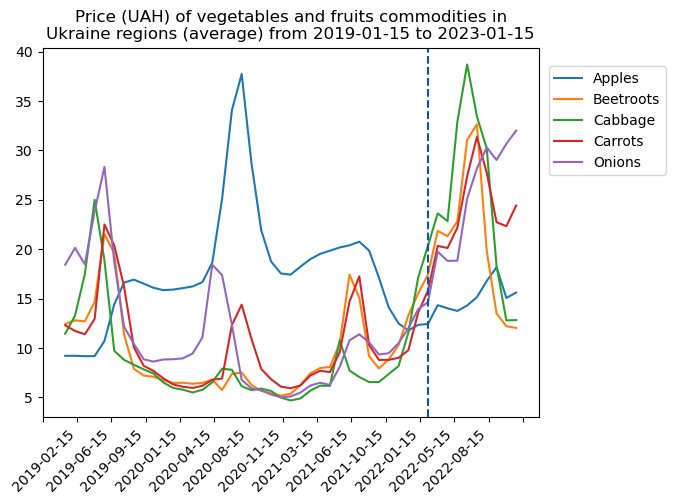

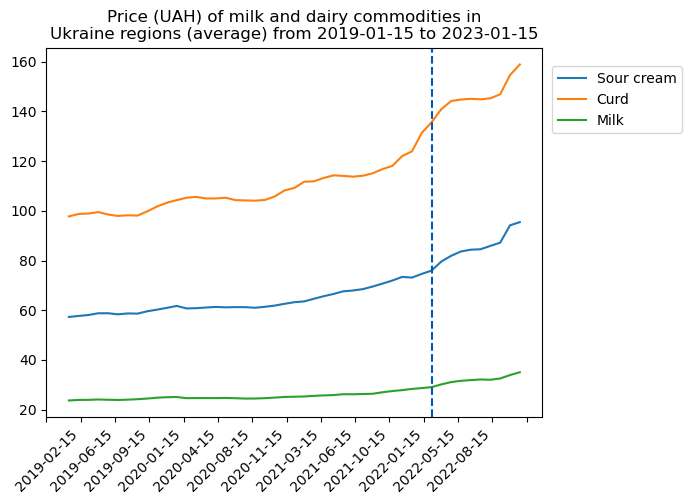

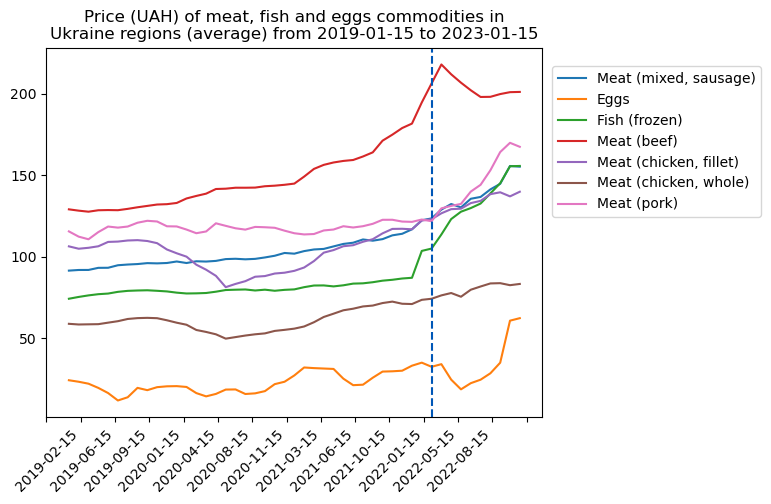

In [9]:
location = "Ukraine regions (average)"

plot_prices_over_time(df_avg_prices, location)

In [10]:
def get_commodity_data(df: pd.DataFrame, commodity: str) -> pd.DataFrame:
    """
    Função auxiliar para retornar um dataframe com 
    os dados da commodity passada como parâmetro
    """
    return df[df['commodity'] == commodity]

In [11]:
def get_pre_post_war_mean(df_commodity: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Função auxiliar para retornar os dataframes com os 
    preços médios de antes (pré Guerra) e desde 2022 
    """
    pre2022 = df_commodity[df_commodity['year'] < 2022]
    post2022 = df_commodity[df_commodity['year'] >= 2022]
    
    df_commodity_pre2022 = pre2022.groupby(['market'])[['price']].mean().reset_index()
    df_commodity_post2022 = post2022.groupby(['market'])[['price']].mean().reset_index()
    
    return df_commodity_pre2022, df_commodity_post2022

In [12]:
def merge_df_region_price(df_prices: pd.DataFrame, geo_reg: gpd.GeoDataFrame) -> pd.DataFrame:
    df_prices_market = geo_reg.merge(df_prices, how = 'inner', on = 'market')
    
    return df_prices_market

In [13]:
def commodity_price_map(df_prices_market: gpd.GeoDataFrame, commodity: str, min_price: float, max_price: float):
    coordinates = [49.5, 31]
    zstart = 6
    colors = ['LightBlue', 'LightGreen', 'Green', 'Orange', 'DarkOrange', 'DarkRed']
    style_function = lambda x: {'weight': 0.8, 
                                'color': 'black',
                                'fillColor': colormap(x['properties']['price']), 
                                'fillOpacity': 0.75}
    
    colormap = cm.LinearColormap(colors = colors, 
                                 vmin = min_price, 
                                 vmax = max_price, 
                                 caption = f"{commodity} price")
    
    map_commodity_price = folium.Map(location = coordinates, tiles = 'cartodbpositron', zoom_start = zstart)
    
    colormap.add_to(map_commodity_price)
    
    folium.features.GeoJson(
        df_prices_market,
        style_function = style_function
    ).add_to(map_commodity_price)
    
    return map_commodity_price    

In [14]:
geo_regions = gpd.read_file("../Dados/ukraine_regions.geojson")

display(geo_regions.head())

,region_en,region_ua,geometry
0,Cherkasy Oblast,Черкаська область,"POLYGON ((32.15047 50.19769, 32.15050 50.19181..."
1,Chernihiv Oblast,Чернігівська область,"POLYGON ((33.19667 52.37500, 33.20612 52.36700..."
2,Chernivtsi Oblast,Чернівецька область,"POLYGON ((25.62595 48.67673, 25.64460 48.67159..."
3,Autonomous Republic of Crimea,Автономна Республіка Крим,"MULTIPOLYGON (((33.79458 44.39153, 33.79291 44..."
4,Dnipropetrovsk Oblast,Дніпропетровська область,"POLYGON ((34.92995 49.15574, 34.92076 49.14992..."


In [15]:
geo_reg = geo_regions[['region_en', 'geometry']]

geo_reg["market"] = geo_reg["region_en"].map(lambda x: x.replace(" Oblast", ""))

display(geo_reg.head())

,region_en,geometry,market
0,Cherkasy Oblast,"POLYGON ((32.15047 50.19769, 32.15050 50.19181...",Cherkasy
1,Chernihiv Oblast,"POLYGON ((33.19667 52.37500, 33.20612 52.36700...",Chernihiv
2,Chernivtsi Oblast,"POLYGON ((25.62595 48.67673, 25.64460 48.67159...",Chernivtsi
3,Autonomous Republic of Crimea,"MULTIPOLYGON (((33.79458 44.39153, 33.79291 44...",Autonomous Republic of Crimea
4,Dnipropetrovsk Oblast,"POLYGON ((34.92995 49.15574, 34.92076 49.14992...",Dnipropetrovsk


Código a seguir referente à análise geoespacial da mudança do preço do __arroz__ antes e a partir de 2022 (início da guerra) na Ucrânia

In [16]:
df_rice_prices_year = get_commodity_data(df_commodities, 'Rice')

display(df_rice_prices_year)

,date,market,category,commodity,price,usdprice,year
29921,2019-01-15,Cherkasy,cereals and tubers,Rice,22.08,0.7948,2019
29963,2019-01-15,Chernihiv,cereals and tubers,Rice,22.31,0.8030,2019
30005,2019-01-15,Chernivtsi,cereals and tubers,Rice,26.21,0.9434,2019
30047,2019-01-15,Dnipropetrovsk,cereals and tubers,Rice,22.24,0.8005,2019
30089,2019-01-15,Donetsk,cereals and tubers,Rice,26.34,0.9481,2019
...,...,...,...,...,...,...,...
77325,2023-01-15,Vinnytsya,cereals and tubers,Rice,58.20,1.5915,2023
77365,2023-01-15,Volyn,cereals and tubers,Rice,59.26,1.6205,2023
77405,2023-01-15,Zakarpattya,cereals and tubers,Rice,59.75,1.6339,2023
77445,2023-01-15,Zaporizhzhya,cereals and tubers,Rice,62.31,1.7039,2023


In [17]:
rice_mean_price_pre2022, rice_mean_price_post2022 = get_pre_post_war_mean(df_rice_prices_year)

In [18]:
display(rice_mean_price_pre2022.head())

,market,price
0,Cherkasy,23.171389
1,Chernihiv,21.448611
2,Chernivtsi,25.042500
3,Dnipropetrovsk,23.630833
4,Donetsk,27.833889


In [19]:
display(rice_mean_price_post2022.head())

,market,price
0,Cherkasy,45.617273
1,Chernihiv,47.553333
2,Chernivtsi,45.542727
3,Dnipropetrovsk,47.296364
4,Donetsk,33.440000


In [20]:
rice_prices_list = rice_mean_price_pre2022.price.tolist() + rice_mean_price_post2022.price.tolist()

rice_min_price = min(rice_prices_list)
rice_max_price = max(rice_prices_list)

In [21]:
rice_pre2022_data = merge_df_region_price(rice_mean_price_pre2022, geo_reg)

commodity_price_map(rice_pre2022_data, 'Rice', rice_min_price, rice_max_price)

In [22]:
rice_post2022_data = merge_df_region_price(rice_mean_price_post2022, geo_reg)

commodity_price_map(rice_post2022_data, 'Rice', rice_min_price, rice_max_price)

In [23]:
### SEM FUNÇÃO

In [24]:
df_rice_prices_year = df_commodities[df_commodities['commodity'] == 'Rice']

display(df_rice_prices_year)

,date,market,category,commodity,price,usdprice,year
29921,2019-01-15,Cherkasy,cereals and tubers,Rice,22.08,0.7948,2019
29963,2019-01-15,Chernihiv,cereals and tubers,Rice,22.31,0.8030,2019
30005,2019-01-15,Chernivtsi,cereals and tubers,Rice,26.21,0.9434,2019
30047,2019-01-15,Dnipropetrovsk,cereals and tubers,Rice,22.24,0.8005,2019
30089,2019-01-15,Donetsk,cereals and tubers,Rice,26.34,0.9481,2019
...,...,...,...,...,...,...,...
77325,2023-01-15,Vinnytsya,cereals and tubers,Rice,58.20,1.5915,2023
77365,2023-01-15,Volyn,cereals and tubers,Rice,59.26,1.6205,2023
77405,2023-01-15,Zakarpattya,cereals and tubers,Rice,59.75,1.6339,2023
77445,2023-01-15,Zaporizhzhya,cereals and tubers,Rice,62.31,1.7039,2023


In [25]:
df_rice_pre2022 = df_rice_prices_year[df_rice_prices_year['year'] < 2022]
df_rice_post2022 = df_rice_prices_year[df_rice_prices_year['year'] >= 2022]

In [26]:
mean_price_rice_pre2022 = df_rice_pre2022.groupby(['market'])[['price']].mean().reset_index()

display(mean_price_rice_pre2022)

,market,price
0,Cherkasy,23.171389
1,Chernihiv,21.448611
2,Chernivtsi,25.042500
3,Dnipropetrovsk,23.630833
4,Donetsk,27.833889
5,Iv.-Frankivsk,23.949167
6,Kharkiv,22.960556
7,Kherson,24.745833
8,Khmelnytskiy,23.383333
9,Kirovohrad,22.684000


In [27]:
mean_price_rice_post2022 = df_rice_post2022.groupby(['market'])[['price']].mean().reset_index()

display(mean_price_rice_post2022)

,market,price
0,Cherkasy,45.617273
1,Chernihiv,47.553333
2,Chernivtsi,45.542727
3,Dnipropetrovsk,47.296364
4,Donetsk,33.440000
5,Iv.-Frankivsk,44.021111
6,Kharkiv,50.642857
7,Kherson,47.165455
8,Khmelnytskiy,46.446000
9,Kyiv,47.114444


In [28]:
geo_regions = gpd.read_file("../Dados/ukraine_regions.geojson")

display(geo_regions.head())

,region_en,region_ua,geometry
0,Cherkasy Oblast,Черкаська область,"POLYGON ((32.15047 50.19769, 32.15050 50.19181..."
1,Chernihiv Oblast,Чернігівська область,"POLYGON ((33.19667 52.37500, 33.20612 52.36700..."
2,Chernivtsi Oblast,Чернівецька область,"POLYGON ((25.62595 48.67673, 25.64460 48.67159..."
3,Autonomous Republic of Crimea,Автономна Республіка Крим,"MULTIPOLYGON (((33.79458 44.39153, 33.79291 44..."
4,Dnipropetrovsk Oblast,Дніпропетровська область,"POLYGON ((34.92995 49.15574, 34.92076 49.14992..."


In [29]:
geo_reg = geo_regions[['region_en', 'geometry']]

geo_reg["market"] = geo_reg["region_en"].map(lambda x: x.replace(" Oblast", ""))

display(geo_reg.head())

,region_en,geometry,market
0,Cherkasy Oblast,"POLYGON ((32.15047 50.19769, 32.15050 50.19181...",Cherkasy
1,Chernihiv Oblast,"POLYGON ((33.19667 52.37500, 33.20612 52.36700...",Chernihiv
2,Chernivtsi Oblast,"POLYGON ((25.62595 48.67673, 25.64460 48.67159...",Chernivtsi
3,Autonomous Republic of Crimea,"MULTIPOLYGON (((33.79458 44.39153, 33.79291 44...",Autonomous Republic of Crimea
4,Dnipropetrovsk Oblast,"POLYGON ((34.92995 49.15574, 34.92076 49.14992...",Dnipropetrovsk


In [30]:
rice_prices_list = mean_price_rice_pre2022.price.tolist() + mean_price_rice_post2022.price.tolist()

min_price = min(rice_prices_list)
max_price = max(rice_prices_list)

coordinates = [49.5, 31]
zstart = 6

colors = ['LightBlue', 'LightGreen', 'Green', 'Orange', 'DarkOrange', 'DarkRed']

style_function = lambda x: {'weight': 0.8, 
                            'color': 'black',
                            'fillColor': colormap(x['properties']['price']), 
                            'fillOpacity': 0.75}

colormap = cm.LinearColormap(colors = colors, 
                             vmin = min_price, 
                             vmax = max_price, 
                             caption = "Rice price")

In [31]:
map_rice_pre2022 = folium.Map(location = coordinates, tiles = 'cartodbpositron', zoom_start = zstart)

rice_pre2022_data = geo_reg.merge(mean_price_rice_pre2022, how = 'inner', on = 'market')

colormap.add_to(map_rice_pre2022)

folium.features.GeoJson(
    rice_pre2022_data,
    style_function = style_function
).add_to(map_rice_pre2022)

map_rice_pre2022

In [32]:
map_rice_post2022 = folium.Map(location = coordinates, tiles = 'cartodbpositron', zoom_start = zstart)

rice_post2022_data = geo_reg.merge(mean_price_rice_post2022, how = 'inner', on = 'market')

colormap.add_to(map_rice_post2022)

folium.features.GeoJson(
    rice_post2022_data,
    style_function = style_function
).add_to(map_rice_post2022)

map_rice_post2022

In [33]:
rice_mean_diff = mean_price_rice_post2022.merge(mean_price_rice_pre2022, how = 'inner', on = 'market')

display(rice_mean_diff)

,market,price_x,price_y
0,Cherkasy,45.617273,23.171389
1,Chernihiv,47.553333,21.448611
2,Chernivtsi,45.542727,25.042500
3,Dnipropetrovsk,47.296364,23.630833
4,Donetsk,33.440000,27.833889
5,Iv.-Frankivsk,44.021111,23.949167
6,Kharkiv,50.642857,22.960556
7,Kherson,47.165455,24.745833
8,Khmelnytskiy,46.446000,23.383333
9,Kyiv,47.114444,27.914167


In [34]:
rice_mean_diff['price_diff'] = rice_mean_diff['price_x'] - rice_mean_diff['price_y']

display(rice_mean_diff)

,market,price_x,price_y,price_diff
0,Cherkasy,45.617273,23.171389,22.445884
1,Chernihiv,47.553333,21.448611,26.104722
2,Chernivtsi,45.542727,25.042500,20.500227
3,Dnipropetrovsk,47.296364,23.630833,23.665530
4,Donetsk,33.440000,27.833889,5.606111
5,Iv.-Frankivsk,44.021111,23.949167,20.071944
6,Kharkiv,50.642857,22.960556,27.682302
7,Kherson,47.165455,24.745833,22.419621
8,Khmelnytskiy,46.446000,23.383333,23.062667
9,Kyiv,47.114444,27.914167,19.200278


In [35]:
min_mean_price = min(rice_mean_diff['price_diff'])
max_mean_price = max(rice_mean_diff['price_diff'])

bins_diff = np.linspace(min_mean_price, max_mean_price, 12)

In [36]:
map_rice_diff = folium.Map(location = coordinates, tiles = 'cartodbpositron', zoom_start = zstart)

rice_diff_data = geo_reg.merge(rice_mean_diff, on = 'market')

Choropleth(
    geo_data = rice_diff_data,
    data = rice_diff_data,
    columns = ['region_en', 'price_diff'],
    key_on = "feature.properties.region_en", 
    fill_color = 'BuGn',
    bins = bins_diff,
    legend_name = "Diferença de preços do arroz entre antes e depois de 2022"
).add_to(map_rice_diff)

map_rice_diff